In [1]:

import argparse
import os
from datetime import datetime
import re
from multiprocessing import Pool, cpu_count
from functools import partial

import yaml
import wandb
import torch
import numpy as np
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import WandbLogger
from pytorch_lightning.callbacks import ModelCheckpoint
from torch.nn import MSELoss, HuberLoss
from pathlib import Path
import sys
# Add project root to Python path
sys.path.insert(0, "/home/griffingoodwin/2025-HL-Flaring-MEGS-AI")


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pylab as pl
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
import os

In [3]:
import glob

sxr_dir = '/mnt/data/STEREO/stereo_ML-ready_2013/'
output_dir = '/mnt/data/STEREO/2013-6ch'
os.makedirs(output_dir, exist_ok=True)

sxr_files = glob.glob(os.path.join(sxr_dir, '*.npy'))

for f in sxr_files:
    try:
        arr = np.load(f)
        base = os.path.basename(f)
        out_path = os.path.join(output_dir, base)
        # If already (6,512,512), just copy to new dir
        if arr.shape == (6, 512, 512):
            np.save(out_path, arr)
            print(f"{base}: already shape {arr.shape}, copied to new dir")
            continue
        # Add two zero channels at the beginning if needed
        if arr.shape[0] == 4 and arr.shape[1] == 512 and arr.shape[2] == 512:
            arr_new = np.zeros((6, 512, 512), dtype=arr.dtype)
            arr_new[2:] = arr
            np.save(out_path, arr_new)
            print(f"{base}: updated to shape {arr_new.shape} and saved to new dir")
        else:
            print(f"{base}: unexpected shape {arr.shape}, skipping")
    except Exception as e:
        print(f"Error loading {f}: {e}")




2013-04-16T14:00:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-03-12T11:10:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-03-21T23:40:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-04-05T08:10:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-03-15T06:10:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-03-27T04:40:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-04-27T12:50:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-04-17T07:10:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-04-28T13:50:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-04-04T14:00:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-03-12T08:50:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-03-01T15:10:00.npy: updated to shape (6, 512, 512) and saved to new dir
2013-04-15T04:10:00.npy: updated to shape (6, 512, 512) and saved to new dir

In [ ]:
stereo = np.load("/mnt/data/STEREO/EUV/2023-06-13T03:30:00.npy")

In [ ]:
plt.imshow(stereo[5])

In [5]:
from pathlib import Path
import numpy as np
from sunpy.net import Fido, attrs as a
from concurrent.futures import ThreadPoolExecutor
import logging
import xarray as xr
import pandas as pd
class SXRDownloader:
    logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

    def __init__(self, save_dir: str = '/downloads/goes_data', concat_dir: str = '/downloads/goes_combined'):
        self.save_dir = Path(save_dir)
        self.save_dir.mkdir(exist_ok=True)
        self.concat_dir = Path(concat_dir)
        self.concat_dir.mkdir(exist_ok=True)
        self.used_g13_files = []
        self.used_g14_files = []
        self.used_g15_files = []
        self.used_g16_files = []
        self.used_g17_files = []
        self.used_g18_files = []

    def download_and_save_goes_data(self, start='2023-07-01', end='2023-08-15', max_workers=4):
        """
        Download GOES X-ray data at 1-minute cadence for a specified time range, including all available satellites.

        Parameters:
        - start (str): Start date for the query (e.g., '2023-07-01')
        - end (str): End date for the query (e.g., '2023-08-15')
        - max_workers (int): Number of parallel download threads
        """
        logging.info(f"Searching GOES X-ray data from {start} to {end} for all satellites at 1-minute cadence...")

        # Query for all GOES satellites with 1-minute averaged XRS data
        goes_query = Fido.search(
            a.Time(start, end),
            a.Instrument('XRS'),
            a.Resolution('avg1m')  # 1-minute averaged data
        )

        logging.info(f"Found {len(goes_query)} GOES files.")

        # Skip if no files found
        if len(goes_query) == 0:
            logging.warning("No files found for the specified query.")
            return []

        # Define download function for a single file
        def download_file(file_entry, path_template):
            try:
                fido_result = Fido.fetch(file_entry, path=str(path_template / "{file}"))
                return fido_result
            except Exception as e:
                logging.error(f"Failed to download {file_entry['file']}: {e}")
                return []

        # Use ThreadPoolExecutor for parallel downloads
        logging.info(f"Downloading {len(goes_query[0])} files with {max_workers} workers...")
        downloaded_files = []
        with ThreadPoolExecutor(max_workers=max_workers) as executor:
            # Create download tasks for each file
            futures = [
                executor.submit(download_file, row, self.save_dir)
                for row in goes_query[0]
            ]
            # Collect results
            for future in futures:
                result = future.result()
                downloaded_files.extend(result)

        logging.info(f"Saved {len(downloaded_files)} files to {self.save_dir}")
        return downloaded_files

In [6]:

downloader = SXRDownloader(save_dir='/mnt/data/STEREO/SXR-2013', concat_dir='/mnt/data/STEREO/SXR-combined')

downloader.download_and_save_goes_data(start='2013-03-01', end='2013-04-30', max_workers=4)

2025-10-07 14:58:57 - root - INFO: Searching GOES X-ray data from 2013-03-01 to 2013-04-30 for all satellites at 1-minute cadence...
2025-10-07 14:59:04 - root - INFO: Found 1 GOES files.
2025-10-07 14:59:04 - root - INFO: Downloading 59 files with 4 workers...
/opt/conda/lib/python3.10/site-packages/parfive/downloader.py:258: UserWarning: This download has been started in a thread which is not the main thread. You will not be able to interrupt the download.
  warnings.warn(


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130302_v2-2-1.nc:   0%|          | 0.00/59.6k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130304_v2-2-1.nc:   0%|          | 0.00/58.5k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130301_v2-2-1.nc:   0%|          | 0.00/59.8k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130303_v2-2-1.nc:   0%|          | 0.00/59.0k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130305_v2-2-1.nc:   0%|          | 0.00/59.3k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130306_v2-2-1.nc:   0%|          | 0.00/58.5k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130307_v2-2-1.nc:   0%|          | 0.00/57.9k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130308_v2-2-1.nc:   0%|          | 0.00/57.5k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130309_v2-2-1.nc:   0%|          | 0.00/58.0k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130310_v2-2-1.nc:   0%|          | 0.00/57.6k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130311_v2-2-1.nc:   0%|          | 0.00/57.6k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130314_v2-2-1.nc:   0%|          | 0.00/58.1k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130315_v2-2-1.nc:   0%|          | 0.00/59.7k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130316_v2-2-1.nc:   0%|          | 0.00/59.6k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130318_v2-2-1.nc:   0%|          | 0.00/59.9k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130319_v2-2-1.nc:   0%|          | 0.00/59.2k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130317_v2-2-1.nc:   0%|          | 0.00/59.7k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130320_v2-2-1.nc:   0%|          | 0.00/59.7k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130321_v2-2-1.nc:   0%|          | 0.00/59.9k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130322_v2-2-1.nc:   0%|          | 0.00/60.0k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130323_v2-2-1.nc:   0%|          | 0.00/59.0k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130324_v2-2-1.nc:   0%|          | 0.00/57.0k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130325_v2-2-1.nc:   0%|          | 0.00/57.4k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130326_v2-2-1.nc:   0%|          | 0.00/56.9k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130327_v2-2-1.nc:   0%|          | 0.00/57.3k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130328_v2-2-1.nc:   0%|          | 0.00/58.7k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130329_v2-2-1.nc:   0%|          | 0.00/59.4k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130330_v2-2-1.nc:   0%|          | 0.00/58.7k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130331_v2-2-1.nc:   0%|          | 0.00/59.2k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130401_v2-2-1.nc:   0%|          | 0.00/58.4k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130402_v2-2-1.nc:   0%|          | 0.00/58.6k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130403_v2-2-1.nc:   0%|          | 0.00/58.8k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130404_v2-2-1.nc:   0%|          | 0.00/58.6k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130405_v2-2-1.nc:   0%|          | 0.00/58.9k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130406_v2-2-1.nc:   0%|          | 0.00/59.5k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130407_v2-2-1.nc:   0%|          | 0.00/59.7k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130408_v2-2-1.nc:   0%|          | 0.00/59.1k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130409_v2-2-1.nc:   0%|          | 0.00/59.8k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130410_v2-2-1.nc:   0%|          | 0.00/60.2k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130412_v2-2-1.nc:   0%|          | 0.00/60.5k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130411_v2-2-1.nc:   0%|          | 0.00/60.9k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130413_v2-2-1.nc:   0%|          | 0.00/58.0k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130414_v2-2-1.nc:   0%|          | 0.00/57.7k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130415_v2-2-1.nc:   0%|          | 0.00/58.1k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130416_v2-2-1.nc:   0%|          | 0.00/58.9k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130417_v2-2-1.nc:   0%|          | 0.00/58.7k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130418_v2-2-1.nc:   0%|          | 0.00/58.2k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130419_v2-2-1.nc:   0%|          | 0.00/58.1k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130420_v2-2-1.nc:   0%|          | 0.00/59.1k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130421_v2-2-1.nc:   0%|          | 0.00/60.7k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130422_v2-2-1.nc:   0%|          | 0.00/59.5k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130423_v2-2-1.nc:   0%|          | 0.00/60.1k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130424_v2-2-1.nc:   0%|          | 0.00/60.5k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130425_v2-2-1.nc:   0%|          | 0.00/60.8k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130426_v2-2-1.nc:   0%|          | 0.00/60.8k [00:00<?, ?B/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

sci_xrsf-l2-avg1m_g15_d20130427_v2-2-1.nc:   0%|          | 0.00/60.8k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130428_v2-2-1.nc:   0%|          | 0.00/60.4k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130429_v2-2-1.nc:   0%|          | 0.00/60.7k [00:00<?, ?B/s]

sci_xrsf-l2-avg1m_g15_d20130430_v2-2-1.nc:   0%|          | 0.00/60.3k [00:00<?, ?B/s]

2025-10-07 14:59:17 - root - INFO: Saved 59 files to /mnt/data/STEREO/SXR-2013


['/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130301_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130302_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130303_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130304_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130305_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130306_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130307_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130308_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130309_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130310_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130311_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130314_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130315_v2-2-1.nc',
 '/mnt/data/STEREO/SXR-2013/sci_xrsf-l2-avg1m_g15_d20130316_v2-2

In [7]:
import argparse
import logging
from pathlib import Path
from typing import List, Tuple

import numpy as np
import pandas as pd
import xarray as xr
from tqdm import tqdm


class SXRDataProcessor:
    """Class to process GOES X-ray data, including downloading, combining, and interpolating data from multiple satellites.
    This class handles the downloading of GOES data, combining data from different satellites, and applying interpolation
    in log space to the X-ray flux data.
    It also tracks which files were used in the processing.
    Parameters
    ----------
    save_dir : str
        Directory where downloaded GOES data will be saved.
    concat_dir : str
        Directory where combined GOES data will be saved.
    """

    def __init__(self, data_dir: str = '/mnt/data/AUGUST/GOES-timespan', output_dir: str = '/mnt/data/AUGUST/combined'):
        self.data_dir = Path(data_dir)
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(exist_ok=True)
        self.used_g13_files = []
        self.used_g14_files = []
        self.used_g15_files = []
        self.used_g16_files = []
        self.used_g17_files = []
        self.used_g18_files = []

    def combine_goes_data(self, columns_to_interp=["xrsb_flux", "xrsa_flux"]):
        """
        Combine GOES-16 and GOES-18 files and track source files used.
        Parameters
        """
        print("🔍 Scanning for GOES data files...")
        
        g13_files = sorted(self.data_dir.glob("*g13*.nc"))
        g14_files = sorted(self.data_dir.glob("*g14*.nc"))
        g15_files = sorted(self.data_dir.glob("*g15*.nc"))
        g16_files = sorted(self.data_dir.glob("*g16*.nc"))
        g17_files = sorted(self.data_dir.glob("*g17*.nc"))
        g18_files = sorted(self.data_dir.glob("*g18*.nc"))
        
        total_files = len(g13_files) + len(g14_files) + len(g15_files) + len(g16_files) + len(g17_files) + len(g18_files)
        logging.info(
            f"Found {len(g13_files)} GOES-13 files, {len(g14_files)} GOES-14 files, {len(g15_files)} GOES-15 files, {len(g16_files)} GOES-16 files, {len(g17_files)} GOES-17 files, and {len(g18_files)} GOES-18 files.")
        print(f"📊 Total files found: {total_files}")
        
        if total_files == 0:
            print("⚠️  No GOES data files found in the specified directory.")
            return

        def process_files(files, satellite_name, output_file, used_file_list):
            datasets = []
            combined_meta = {}
            successful_files = 0
            failed_files = 0

            print(f"🛰️  Processing {satellite_name} ({len(files)} files)...")
            
            # Progress bar for file loading
            with tqdm(files, desc=f"Loading {satellite_name}", unit="file", 
                     bar_format='{l_bar}{bar}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]') as pbar:
                for file_path in pbar:
                    pbar.set_postfix_str(f"Loading {file_path.name}")
                    try:
                        ds = xr.open_dataset(str(file_path))
                        datasets.append(ds)
                        used_file_list.append(file_path)  # Track file used
                        successful_files += 1
                        logging.info(f"Loaded {file_path.name}")
                    except Exception as e:
                        failed_files += 1
                        logging.error(f"Could not load {file_path.name}: {e}")
                        continue
                    finally:
                        if 'ds' in locals():
                            ds.close()

            if not datasets:
                print(f"❌ No valid datasets for {satellite_name}")
                logging.warning(f"No valid datasets for {satellite_name}")
                return

            print(f"📊 Processing {len(datasets)} datasets for {satellite_name}...")
            
            try:
                print(f"🔗 Concatenating datasets...")
                combined_ds = xr.concat(datasets, dim='time').sortby('time')
                
                # Scaling factors for GOES-13, GOES-14, and GOES-15
                if satellite_name in ['GOES-13', 'GOES-14', 'GOES-15']:
                    print(f"⚖️  Applying scaling factors for {satellite_name}...")
                    combined_ds['xrsa_flux'] = combined_ds['xrsa_flux'] / .85
                    combined_ds['xrsb_flux'] = combined_ds['xrsb_flux'] / .7
                
                print(f"🔄 Converting to DataFrame...")
                df = combined_ds.to_dataframe().reset_index()
                
                if 'quad_diode' in df.columns:
                    print(f"🔍 Filtering quad diode data...")
                    df = df[df['quad_diode'] == 0]  # Filter out quad diode data
                
                df['time'] = pd.to_datetime(df['time'])
                df.set_index('time', inplace=True)
                
                print(f"📈 Applying log interpolation...")
                df_log = np.log10(df[columns_to_interp].replace(0, np.nan))

                # Step 3: Interpolate in log space
                df_log_interp = df_log.interpolate(method="time", limit_direction="both")

                # Step 4: Back-transform to linear space
                df[columns_to_interp] = 10 ** df_log_interp

                # Add min and max dates to filename
                min_date = df.index.min().strftime('%Y%m%d')
                max_date = df.index.max().strftime('%Y%m%d')
                filename = f"{str(output_file)}_{min_date}_{max_date}.csv"
                
                print(f"💾 Saving to {filename}...")
                df.to_csv(filename, index=True)

                print(f"✅ Successfully processed {satellite_name}: {successful_files} files loaded, {failed_files} failed")
                logging.info(f"Saved combined file: {output_file}")
                
            except Exception as e:
                print(f"❌ Failed to process {satellite_name}: {e}")
                logging.error(f"Failed to write {output_file}: {e}")
            finally:
                for ds in datasets:
                    ds.close()

        # Create list of satellites to process
        satellites_to_process = []
        if len(g13_files) != 0:
            satellites_to_process.append((g13_files, "GOES-13", self.output_dir / "combined_g13_avg1m", self.used_g13_files))
        if len(g14_files) != 0:
            satellites_to_process.append((g14_files, "GOES-14", self.output_dir / "combined_g14_avg1m", self.used_g14_files))
        if len(g15_files) != 0:
            satellites_to_process.append((g15_files, "GOES-15", self.output_dir / "combined_g15_avg1m", self.used_g15_files))
        if len(g16_files) != 0:
            satellites_to_process.append((g16_files, "GOES-16", self.output_dir / "combined_g16_avg1m", self.used_g16_files))
        if len(g17_files) != 0:
            satellites_to_process.append((g17_files, "GOES-17", self.output_dir / "combined_g17_avg1m", self.used_g17_files))
        if len(g18_files) != 0:
            satellites_to_process.append((g18_files, "GOES-18", self.output_dir / "combined_g18_avg1m", self.used_g18_files))

        print(f"\n🚀 Starting processing of {len(satellites_to_process)} satellites...")
        
        # Process each satellite with overall progress tracking
        successful_satellites = 0
        failed_satellites = 0
        
        for i, (files, satellite_name, output_file, used_file_list) in enumerate(satellites_to_process, 1):
            print(f"\n{'='*60}")
            print(f"📡 Processing satellite {i}/{len(satellites_to_process)}: {satellite_name}")
            print(f"{'='*60}")
            
            try:
                process_files(files, satellite_name, output_file, used_file_list)
                successful_satellites += 1
            except Exception as e:
                print(f"❌ Failed to process {satellite_name}: {e}")
                failed_satellites += 1
                logging.error(f"Failed to process {satellite_name}: {e}")
        
        # Print final summary
        print(f"\n{'='*60}")
        print(f"📊 PROCESSING COMPLETE")
        print(f"{'='*60}")
        print(f"✅ Successfully processed: {successful_satellites} satellites")
        print(f"❌ Failed: {failed_satellites} satellites")
        print(f"📁 Total files processed: {total_files}")
        print(f"📂 Output directory: {self.output_dir}")
        
        # Print file usage statistics
        total_used_files = (len(self.used_g13_files) + len(self.used_g14_files) + 
                           len(self.used_g15_files) + len(self.used_g16_files) + 
                           len(self.used_g17_files) + len(self.used_g18_files))
        print(f"📋 Files used in processing: {total_used_files}")
        
        if successful_satellites > 0:
            print(f"\n🎉 SXR data processing completed successfully!")
        else:
            print(f"\n⚠️  No satellites were processed successfully.")

In [8]:
sxr = SXRDataProcessor('/mnt/data/STEREO/SXR-2013', '/mnt/data/STEREO/2013-COMB')

In [9]:
sxr.combine_goes_data()

2025-10-07 15:00:04 - root - INFO: Found 0 GOES-13 files, 0 GOES-14 files, 59 GOES-15 files, 0 GOES-16 files, 0 GOES-17 files, and 0 GOES-18 files.


🔍 Scanning for GOES data files...
📊 Total files found: 59

🚀 Starting processing of 1 satellites...

📡 Processing satellite 1/1: GOES-15
🛰️  Processing GOES-15 (59 files)...


Loading GOES-15: 100%|██████████| 59/59 [00:01<00:00, 35.26file/s]


📊 Processing 59 datasets for GOES-15...
🔗 Concatenating datasets...
⚖️  Applying scaling factors for GOES-15...
🔄 Converting to DataFrame...
📈 Applying log interpolation...
💾 Saving to /mnt/data/STEREO/2013-COMB/combined_g15_avg1m_20130301_20130430.csv...


2025-10-07 15:00:06 - root - INFO: Saved combined file: /mnt/data/STEREO/2013-COMB/combined_g15_avg1m


✅ Successfully processed GOES-15: 59 files loaded, 0 failed

📊 PROCESSING COMPLETE
✅ Successfully processed: 1 satellites
❌ Failed: 0 satellites
📁 Total files processed: 59
📂 Output directory: /mnt/data/STEREO/2013-COMB
📋 Files used in processing: 59

🎉 SXR data processing completed successfully!


In [10]:
import pandas as pd
sxr_dat = pd.read_csv("/mnt/data/STEREO/2013-COMB/combined_g15_avg1m_20130301_20130430.csv")

In [11]:
from forecasting.models.vit_patch_model import ViT
import sys
import os

# Add the project root to Python path to ensure imports work
sys.path.insert(0, "/home/griffingoodwin/2025-HL-Flaring-MEGS-AI")

# Load the checkpoint with proper module mapping
vit = ViT.load_from_checkpoint(
    "/mnt/data/COMBINED/new-checkpoint/vit-patch-model-2d-embeddings-reduced-sensitivity-STEREO-epoch=223-val_total_loss=0.0773.ckpt",
    map_location='cpu'  # Load on CPU first, then move to GPU if needed
)

In [3]:
# Alternative loading method if the above fails
from forecasting.models.vision_transformer_custom import ViT
try:
    print("Model loaded successfully!")
except Exception as e:
    print(f"Error loading model: {e}")
    print("Trying alternative loading method...")
    
    # Load the checkpoint manually
    checkpoint = torch.load(
        "/mnt/data/mixed_data/ML-Ready-mixed/baseline/ViT_4_wavelengths_mixed_data_nonoversampling-final-20250808_151611.pth",
        map_location='cpu'
    )
    
    # Create model instance with the hyperparameters from checkpoint
    model_kwargs = checkpoint['hyper_parameters']['model_kwargs']
    sxr_norm = checkpoint['hyper_parameters']['sxr_norm']
    
    vit = ViT(model_kwargs=model_kwargs, sxr_norm=sxr_norm)
    vit.load_state_dict(checkpoint['state_dict'])
    print("Model loaded using alternative method!")


ModuleNotFoundError: No module named 'forecasting'

In [12]:
#/mnt/data/COMBINED/new-checkpoint/vit-patch-model-2d-embeddings-reduced-sensitivity-STEREO-final-20250921_183739.pth
vit.eval()


ViT(
  (model): VisionTransformer(
    (input_layer): Linear(in_features=1024, out_features=512, bias=True)
    (transformer_blocks): ModuleList(
      (0-5): 6 x AttentionBlock(
        (layer_norm_1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
        )
        (layer_norm_2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (linear): Sequential(
          (0): Linear(in_features=512, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.1, inplace=False)
          (3): Linear(in_features=512, out_features=512, bias=True)
          (4): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (mlp_head): Sequential(
      (0): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (1): Linear(in_features=512, out_features=1, bias=True)
    )
    (dropout): Dropout(p=0.1, inplace=

In [13]:
def normalize_sxr(unnormalized_values, sxr_norm):
    """Convert from unnormalized to normalized space"""
    log_values = torch.log10(unnormalized_values + 1e-8)
    normalized = (log_values - float(sxr_norm[0].item())) / float(sxr_norm[1].item())
    return normalized

def unnormalize_sxr(normalized_values, sxr_norm):
    return 10 ** (normalized_values * float(sxr_norm[1].item()) + float(sxr_norm[0].item())) - 1e-8

sxr_norm = np.load("/mnt/data/COMBINED/SXR-SPLIT/normalized_sxr.npy")

In [14]:
from forecasting.data_loaders.SDOAIA_dataloader import AIA_GOESDataset

data_module = AIA_GOESDataset("/mnt/data/STEREO/2013-6ch", "", [171,193,211,304], sxr_transform=None, target_size=(512, 512), only_prediction=True)

In [15]:
data_module.__getitem__(0)[0][0].mean()

tensor(-0.8275)

In [16]:
import torch
from torch.utils.data import DataLoader
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
loader = DataLoader(data_module, batch_size=1, num_workers=4, pin_memory=True)

# Ensure vit and sxr_norm are on the correct device
vit = vit.to(device)
# if isinstance(sxr_norm, torch.Tensor):
#     sxr_norm = sxr_norm.to(device)
# else:
#     sxr_norm = torch.from_numpy(sxr_norm).to(device)

timestamp = []
predictions = []
for batch_idx, batch in enumerate(loader):
    aia_imgs = batch[0]  # Get aia_img from inputs
    sxr = batch[1]
    # Move to device (it's already a tensor)
    aia_imgs = aia_imgs.to(device, non_blocking=True)
    vit.eval()
    with torch.no_grad():
        pred = vit(aia_imgs)
        print(pred[0])
        # Fix: properly extract scalar value from tensor
        # Ensure pred[0] is on CPU before calling .item()
        predictions.append(pred[0].detach().cpu().item())  # Use .item() to get scalar value
        timestamp.append(data_module.__gettimestamp__(batch_idx))


tensor([[5.0770e-07]], device='cuda:0')
tensor([[5.3677e-07]], device='cuda:0')
tensor([[5.8550e-07]], device='cuda:0')
tensor([[5.6206e-07]], device='cuda:0')
tensor([[5.7865e-07]], device='cuda:0')
tensor([[4.4104e-07]], device='cuda:0')
tensor([[4.6874e-07]], device='cuda:0')
tensor([[5.2423e-07]], device='cuda:0')
tensor([[4.3804e-07]], device='cuda:0')
tensor([[3.9029e-07]], device='cuda:0')
tensor([[3.7982e-07]], device='cuda:0')
tensor([[3.6833e-07]], device='cuda:0')
tensor([[2.8389e-07]], device='cuda:0')
tensor([[2.5448e-07]], device='cuda:0')
tensor([[2.6392e-07]], device='cuda:0')
tensor([[2.5913e-07]], device='cuda:0')
tensor([[2.6593e-07]], device='cuda:0')
tensor([[2.7692e-07]], device='cuda:0')
tensor([[2.7163e-07]], device='cuda:0')
tensor([[3.3361e-07]], device='cuda:0')
tensor([[3.4373e-07]], device='cuda:0')
tensor([[3.4797e-07]], device='cuda:0')
tensor([[3.5119e-07]], device='cuda:0')
tensor([[3.4486e-07]], device='cuda:0')
tensor([[3.4077e-07]], device='cuda:0')


In [17]:
predictions

[5.076983597973594e-07,
 5.367706990000443e-07,
 5.85503357797279e-07,
 5.620579486276256e-07,
 5.786505425930955e-07,
 4.410401572840783e-07,
 4.6873554992998834e-07,
 5.242335419097799e-07,
 4.3804405436276284e-07,
 3.902895855389943e-07,
 3.798153329626075e-07,
 3.6832835803579655e-07,
 2.8389297312969575e-07,
 2.544762196521333e-07,
 2.6391955998406047e-07,
 2.5913243462127866e-07,
 2.6593153279463877e-07,
 2.7692027515513473e-07,
 2.7162764126842376e-07,
 3.336098757245054e-07,
 3.4373195489934005e-07,
 3.479678412077192e-07,
 3.511889872243046e-07,
 3.4485867672628956e-07,
 3.4076833799190354e-07,
 3.358075844062114e-07,
 3.3300108270850615e-07,
 3.1762115781930333e-07,
 5.797554649689118e-07,
 6.241990604394232e-07,
 5.380930474530032e-07,
 4.885321231995476e-07,
 4.5837992956876406e-07,
 5.023446192353731e-07,
 4.7127718971751165e-07,
 4.4740843918589235e-07,
 4.825949986297928e-07,
 4.822043706553814e-07,
 4.664046855396009e-07,
 5.294338620842609e-07,
 6.435175237129442e-07,


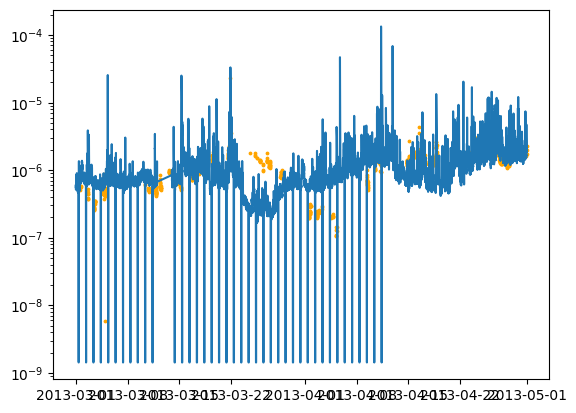

In [18]:
import matplotlib.pyplot as plt
plt.plot(pd.to_datetime(sxr_dat['time']), sxr_dat['xrsb_flux'])
plt.scatter(pd.to_datetime(timestamp), predictions, s=3, c='orange')
plt.yscale('log')

In [19]:
import plotly.graph_objs as go
import plotly.io as pio

# Convert times to pandas DatetimeIndex for plotting
sxr_times = pd.to_datetime(sxr_dat['time'])
pred_times = pd.to_datetime(timestamp)

fig = go.Figure()

# Add SXR flux line
fig.add_trace(go.Scatter(
    x=sxr_times,
    y=sxr_dat['xrsb_flux'],
    mode='lines',
    name='GOES SXR Flux'
))

# Add ViT predictions as scatter
fig.add_trace(go.Scatter(
    x=pred_times,
    y=predictions,
    mode='markers',
    marker=dict(size=5, color='orange'),
    name='ViT Predictions'
))

fig.update_layout(
    yaxis_type="log",
    title="GOES SXR Flux and ViT Predictions",
    xaxis_title="Time",
    yaxis_title="Flux",
    legend=dict(x=0.01, y=0.99)
)

fig.show()

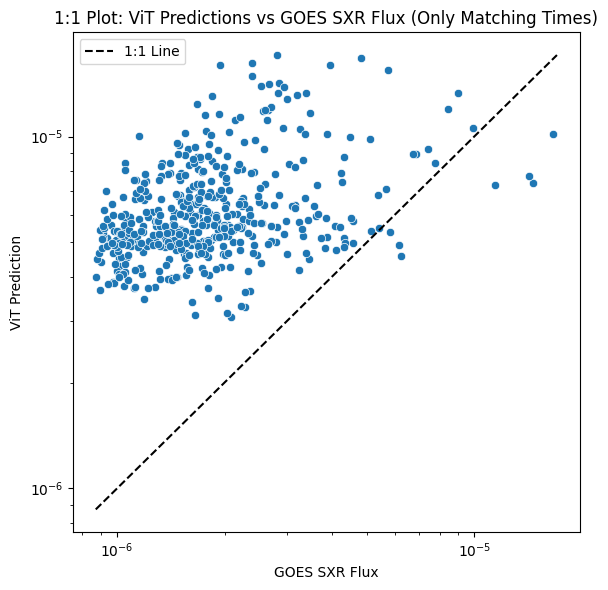

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert times to pandas DatetimeIndex for matching
sxr_times = pd.to_datetime(sxr_dat['time'])
pred_times = pd.to_datetime(timestamp)

# Only keep predictions whose timestamp exists in sxr_times (no interpolation)
pred_in_sxr_mask = np.isin(pred_times.values, sxr_times.values)

# Filter predictions and their times
matched_pred_times = pred_times[pred_in_sxr_mask]
matched_predictions = np.array(predictions)[pred_in_sxr_mask]

# For each matched_pred_time, get the corresponding sxr value
sxr_time_to_flux = dict(zip(sxr_times.values, sxr_dat['xrsb_flux']))
matched_sxr_flux = [sxr_time_to_flux[t] for t in matched_pred_times.values]

# 1-to-1 scatter plot: SXR (true) vs ViT prediction using seaborn
plt.figure(figsize=(6,6))
sns.scatterplot(x=matched_sxr_flux, y=matched_predictions)
min_val = min(np.min(matched_sxr_flux), np.min(matched_predictions))
max_val = max(np.max(matched_sxr_flux), np.max(matched_predictions))
plt.plot([min_val, max_val], [min_val, max_val], 'k--', label='1:1 Line')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('GOES SXR Flux')
plt.ylabel('ViT Prediction')
plt.title('1:1 Plot: ViT Predictions vs GOES SXR Flux (Only Matching Times)')
plt.legend()
plt.tight_layout()
plt.show()


In [20]:
st = np.load("/mnt/data/STEREO/2013-6ch/2013-03-21T21:10:00.npy")

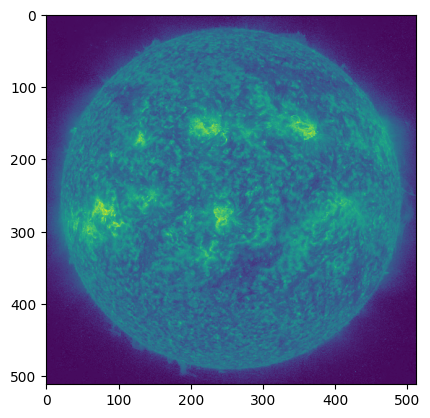

In [25]:
plt.imshow(st[5])